In [ ]:
import pymc as pm
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
from scipy import special, stats
import numpy as np

In [ ]:
az.style.use('arviz-darkgrid')
plt.rcParams['figure.dpi'] = 300

random_seed = 730612
cores = 4

### Question 2

In [15]:
algae = pd.read_csv("algae.csv")
algae = algae[['season', 'size', 'speed', 'mxPH', 'mnO2', 'Cl', 'NO3', 'NH4', 'oPO4', 'PO4', 'Chla', 'a1']]
algae.head()

,season,size,speed,mxPH,mnO2,Cl,NO3,NH4,oPO4,PO4,Chla,a1
0,winter,small,medium,8.00,9.8,60.800,6.238,578.00000,105.000,170.00000,50.0,0.0
1,spring,small,medium,8.35,8.0,57.750,1.288,370.00000,428.750,558.75000,1.3,1.4
2,autumn,small,medium,8.10,11.4,40.020,5.330,346.66699,125.667,187.05701,15.6,3.3
3,spring,small,medium,8.07,4.8,77.364,2.302,98.18200,61.182,138.70000,1.4,3.1
4,autumn,small,medium,8.06,9.0,55.350,10.416,233.70000,58.222,97.58000,10.5,9.2


<Axes: >

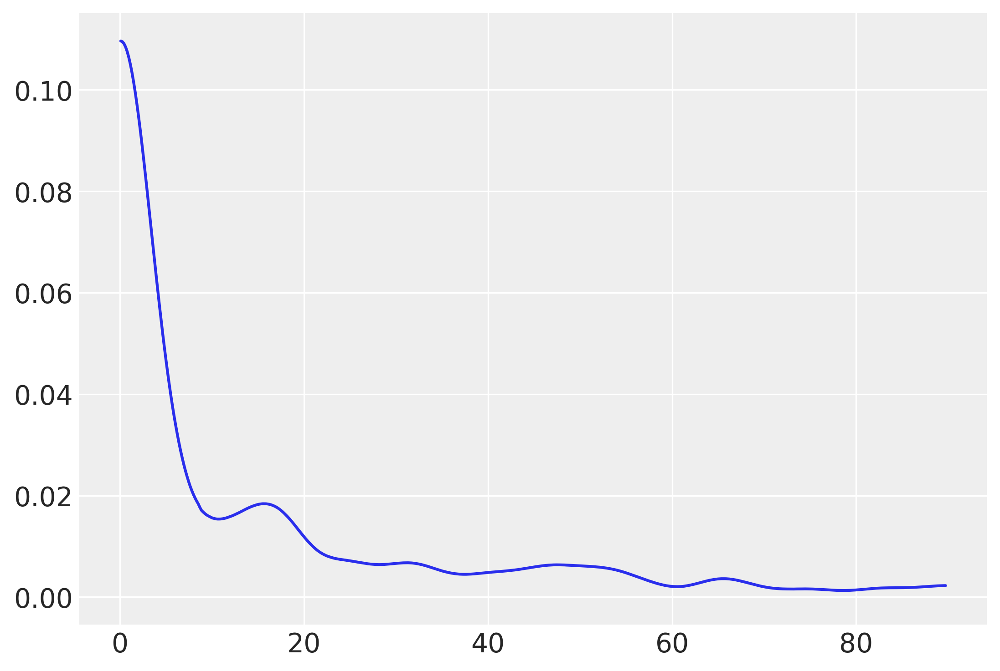

In [ ]:
az.plot_dist(algae['a1'], kind = 'kde')

C:\Users\daven\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\daven\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


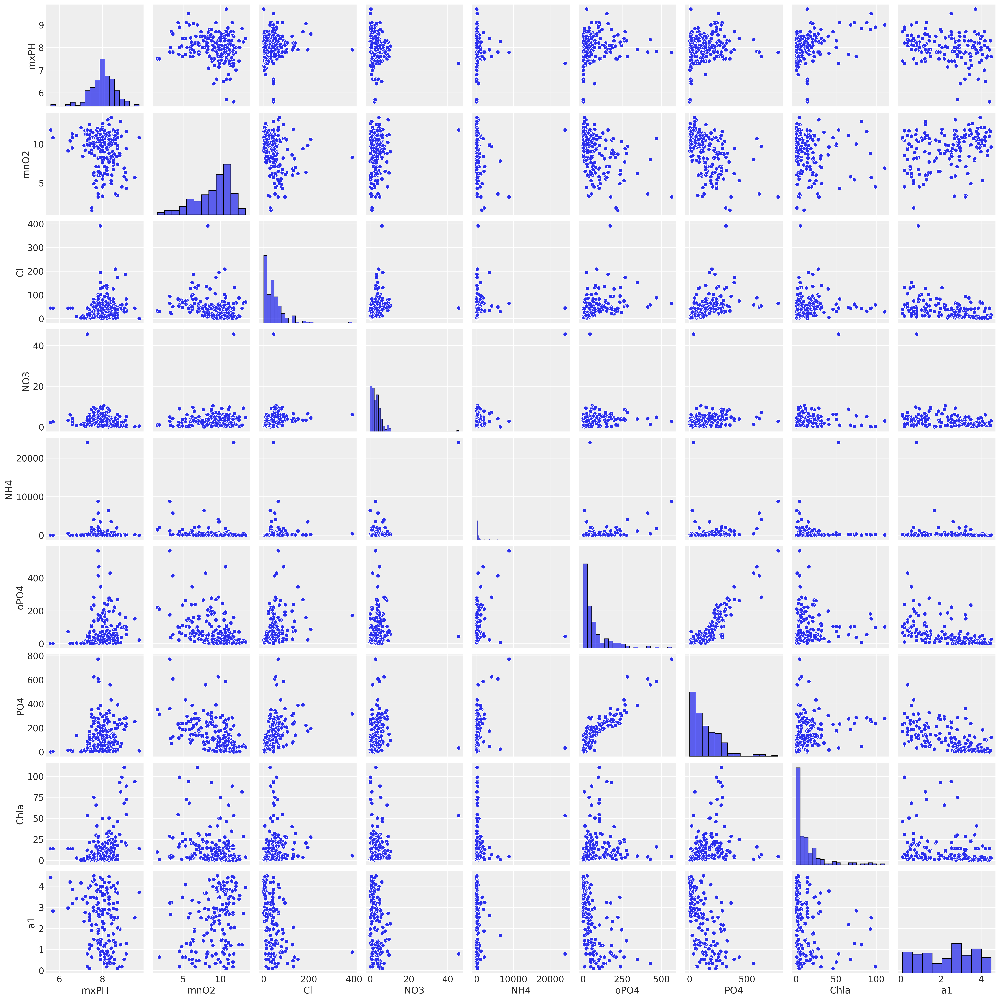

In [ ]:
sns.pairplot(algae[['mxPH', 'mnO2', 'Cl', 'NO3', 'NH4', 'oPO4', 'PO4', 'Chla', 'a1']])

In [16]:
import seaborn as sns

In [17]:
algae[["size", "a1"]].groupby("size").agg(["mean", "std"])

a1           
             mean        std
size                        
large   11.353333  16.458178
medium  11.267857  17.163124
small   27.145070  24.734538

In [ ]:
algae[["speed", "a1"]].groupby("speed").agg(["mean", "std"])

a1           
             mean        std
speed                       
high    23.964286  22.118763
low      8.848485  13.079376
medium  12.132530  20.826678

In [ ]:
algae[["season", "a1"]].groupby("season").agg(["mean", "std"])

a1           
             mean        std
season                      
autumn  17.300000  21.511118
spring  16.264151  22.962470
summer  15.755556  17.680441
winter  16.919355  22.382882

It appears that there is a high density of small a1 values. Small rivers have a higher a1 mean compared to medium and large rivers. High speed rivers have a higher a1 mean compared to low or medium speed rivers. The season does not appear to have a large effect on a1 values, as all season have a mean around 16 a1 units.

In [ ]:
algae[['mxPH', 'mnO2', 'Cl', 'NO3', 'NH4', 'oPO4', 'PO4', 'Chla']].isna().value_counts()
#Cl, NO3, NH4, oPO4, PO4, Chla all have NA vals

mxPH   mnO2   Cl     NO3    NH4    oPO4   PO4    Chla 
False  False  False  False  False  False  False  False    200
Name: count, dtype: int64

In [ ]:
algae[["a1", "season", "size", "speed"]].isnull().isna().value_counts()

a1     season  size   speed
False  False   False  False    200
Name: count, dtype: int64

In [18]:
#replace NA values with column mean
mean_mxPH = algae["mxPH"].mean()
algae["mxPH"].fillna(value=mean_mxPH, inplace=True)

mean_mnO2 = algae["mnO2"].mean()
algae["mnO2"].fillna(value=mean_mnO2, inplace=True)

mean_Cl = algae["Cl"].mean()
algae["Cl"].fillna(value=mean_Cl, inplace=True)

mean_NO3 = algae["NO3"].mean()
algae["NO3"].fillna(value=mean_NO3, inplace=True)

mean_NH4 = algae["NH4"].mean()
algae["NH4"].fillna(value=mean_NH4, inplace=True)

mean_oPO4 = algae["oPO4"].mean()
algae["oPO4"].fillna(value=mean_oPO4, inplace=True)

mean_PO4 = algae["PO4"].mean()
algae["PO4"].fillna(value=mean_PO4, inplace=True)

mean_Chla = algae["Chla"].mean()
algae["Chla"].fillna(value=mean_Chla, inplace=True)

In [19]:
#one hot
algae = pd.get_dummies(algae, drop_first = False, dtype = float)
algae.describe(include = 'all')

,mxPH,mnO2,Cl,NO3,NH4,oPO4,PO4,Chla,a1,season_autumn,season_spring,season_summer,season_winter,size_large,size_medium,size_small,speed_high,speed_low,speed_medium
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,8.011734,9.117778,43.636279,3.282389,501.295828,73.590596,137.882101,13.971197,16.923500,0.200000,0.265000,0.22500,0.310000,0.22500,0.420000,0.355000,0.420000,0.165000,0.415000
std,0.596800,2.379206,45.639480,3.757449,1952.658519,90.677307,128.343892,19.868344,21.348376,0.401004,0.442441,0.41863,0.463654,0.41863,0.494797,0.479714,0.494797,0.372112,0.493958
min,5.600000,1.500000,0.222000,0.050000,5.000000,1.000000,1.000000,0.200000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.700000,7.775000,11.066000,1.312000,38.777750,15.900000,42.791750,2.137500,1.500000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8.055000,9.800000,35.999000,2.740000,103.333000,41.400000,104.863500,5.983500,6.950000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8.400000,10.800000,56.975250,4.420750,229.987500,97.999750,213.250000,17.200000,24.800000,0.000000,1.000000,0.00000,1.000000,0.00000,1.000000,1.000000,1.000000,0.000000,1.000000
max,9.700000,13.400000,391.500000,45.650000,24064.000000,564.599980,771.599980,110.456000,89.800000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


I scaled the predictor variables to center on 0, the mean; now all the numeric predictor variables are in the same scale.

In [20]:
#scale numeric predictor variables
X = algae[['mxPH', 'mnO2', 'Cl', 'NO3', 'NH4', 'oPO4', 'PO4', 'Chla']]
meanx = X.mean().values
scalex = X.std().values
zX = ((X-meanx)/scalex).values

I transformed the response variable with log to reduce skewness in the data. There are many data points around a1 = 0.

In [21]:
#transform response variable (a1) with natural log
algae['a1'] = np.log(algae['a1'] + 1)

I took out season because means were all similar. oPO4 and PO4 highly correlated, instead I just used PO4. Took out NO3, NH4 and CL because appears to have little affect on algae.

In [24]:
with pm.Model() as robust_model:
    B0 = pm.Normal("B0", mu=0, sigma=10)
    B1 = pm.Normal("B1", mu=0, sigma=10)
    B2 = pm.Normal("B2", mu=0, sigma=10)
    B7 = pm.Normal("B7", mu=0, sigma=10)
    B8 = pm.Normal("B8", mu=0, sigma=10)
    B10 = pm.Normal("B10", mu=0, sigma=10) #winter
    B11 = pm.Normal("B11", mu=0, sigma=10) #spring
    B12 = pm.Normal("B12", mu=0, sigma=10) #summer
    B13 = pm.Normal("B13", mu=0, sigma=10) #autumn
    B14 = pm.Normal("B14", mu=0, sigma=10) #low
    B15 = pm.Normal("B15", mu=0, sigma=10) #medium
    B16 = pm.Normal("B16", mu=0, sigma=10) #high

    mu = pm.Deterministic("mu", B0 + B1 * zX[:, 0] + B2 * zX[:, 1] + B7 * zX[:, 6] + B8 * zX[:, 7]
                          + B10 * algae["season_winter"] + B11 * algae["season_spring"] +  B12 * algae["season_summer"] +
                          B13 * algae["season_autumn"] + B14 * algae["speed_low"] + B15 * algae["speed_medium"] + B16 * algae["speed_high"])

    sigma = pm.Uniform('sigma', 10**-5, 10)
    nu = pm.Exponential('nu', 1/29.0)
    algae_results = pm.StudentT('algae_results', nu=nu, mu=mu, sigma=sigma, observed=algae["a1"])


I chose normal distributions for B0, centered on the mean. If all other betas have no affect on algal growth, the mean is a good estimate for the model. Sigma is larger than the usually STDV of 2 because of the wide range of values in predictor variables. All other betas are normally distributed with mu=0. This implies that these predictors will have no affect on algal growth, which is a good null hypothesis.

I chose a uniform distribution for sigma, assuming an equal chance of a value between 10**-5 and 10. This is a good option for an uninformed prior. The nu, degrees of freedom, has a flat exponential distribution, again a good uninformed prior.

I chose the Student T-Test for the likelihood to create a robust model. Outliers in the response variable will not affect the overall distribution as drastically.

In [25]:
with robust_model:
    algae_trace = pm.sample(random_seed = random_seed)

array([[<Axes: title={'center': 'B0'}>, <Axes: title={'center': 'B0'}>],
       [<Axes: title={'center': 'B1'}>, <Axes: title={'center': 'B1'}>],
       [<Axes: title={'center': 'B2'}>, <Axes: title={'center': 'B2'}>],
       [<Axes: title={'center': 'B7'}>, <Axes: title={'center': 'B7'}>],
       [<Axes: title={'center': 'B8'}>, <Axes: title={'center': 'B8'}>],
       [<Axes: title={'center': 'B10'}>, <Axes: title={'center': 'B10'}>],
       [<Axes: title={'center': 'B11'}>, <Axes: title={'center': 'B11'}>],
       [<Axes: title={'center': 'B12'}>, <Axes: title={'center': 'B12'}>],
       [<Axes: title={'center': 'B13'}>, <Axes: title={'center': 'B13'}>],
       [<Axes: title={'center': 'B14'}>, <Axes: title={'center': 'B14'}>],
       [<Axes: title={'center': 'B15'}>, <Axes: title={'center': 'B15'}>],
       [<Axes: title={'center': 'B16'}>, <Axes: title={'center': 'B16'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'

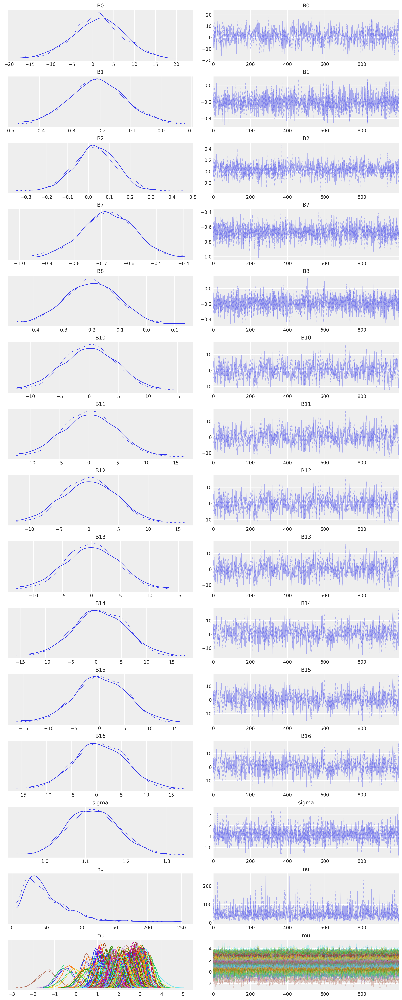

In [26]:
az.plot_trace(algae_trace)

In [27]:
az.summary(algae_trace, var_names = ["B0", "B1", "B2", "B7", "B8", "B10", "B11"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
B0,1.345,5.903,-9.558,12.671,0.199,0.141,882.0,1090.0,1.0
B1,-0.209,0.093,-0.385,-0.031,0.002,0.001,2393.0,1530.0,1.0
B2,0.032,0.103,-0.151,0.227,0.002,0.003,1998.0,1101.0,1.0
B7,-0.676,0.096,-0.860,-0.495,0.002,0.001,2333.0,1444.0,1.0
B8,-0.195,0.093,-0.365,-0.019,0.002,0.001,2549.0,1582.0,1.0
B10,0.148,4.520,-8.482,8.650,0.170,0.120,713.0,876.0,1.0
B11,0.248,4.531,-7.798,9.323,0.170,0.120,710.0,869.0,1.0


In [28]:
az.summary(algae_trace, var_names = ["nu", "sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
nu,50.442,32.828,6.614,107.664,0.749,0.540,1880.0,1468.0,1.0
sigma,1.120,0.062,1.003,1.236,0.001,0.001,2244.0,1555.0,1.0


array([[<Axes: title={'center': 'B0'}>, <Axes: title={'center': 'B1'}>,
        <Axes: title={'center': 'B2'}>],
       [<Axes: title={'center': 'B7'}>, <Axes: title={'center': 'B8'}>,
        <Axes: title={'center': 'B10'}>],
       [<Axes: title={'center': 'B11'}>, <Axes: >, <Axes: >]],
      dtype=object)

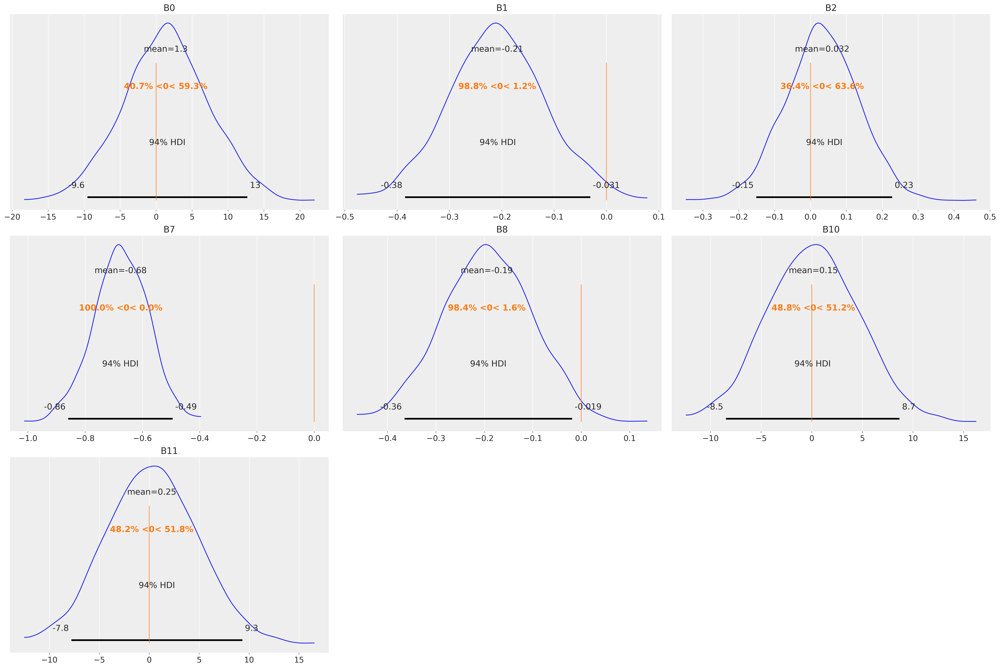

In [29]:
az.plot_posterior(algae_trace, var_names=["B0", "B1", "B2", "B7", "B8", "B10", "B11"], ref_val = 0)

B1, B2, B8 and B11 all contain 0 in their 94% HDI. This suggests that these predictor variables do not have an affect on algal growth. B0, the intercept value, does not appear to be centered around the observed mean. Instead, it is centered around 2.5.

In [30]:
algae_pp = pm.sample_posterior_predictive(algae_trace, model = robust_model,random_seed = random_seed)

<Axes: title={'center': 'algae_results / algae_results'}>

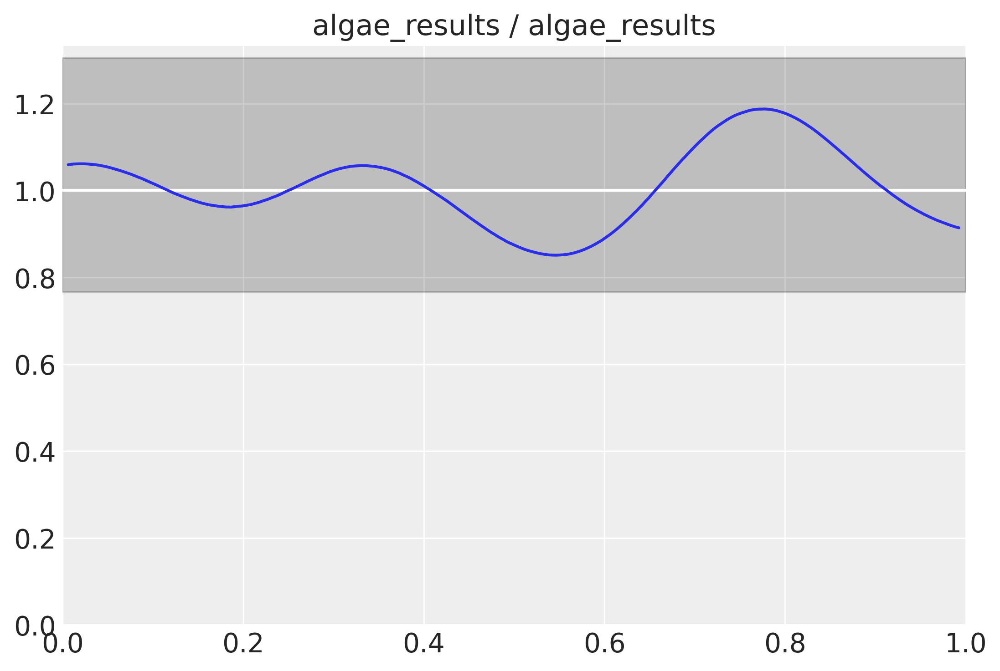

In [ ]:
#Baysian pvalue
az.plot_bpv(algae_pp)

The blue line is a KDE for the proportion of predicted values that are less or equal than the observed computed per observation. The line remains within the darker grey shaded area, indicating well-calibrated predictions.

Despite the encouraging plot above, the posterior predictive plot below displays a posterior predictive mean dissimilar to the shape of the observed data. This can be fixed with multiple techniques, one being transformation of a predictor variable.

<Axes: xlabel='algae_results / algae_results'>

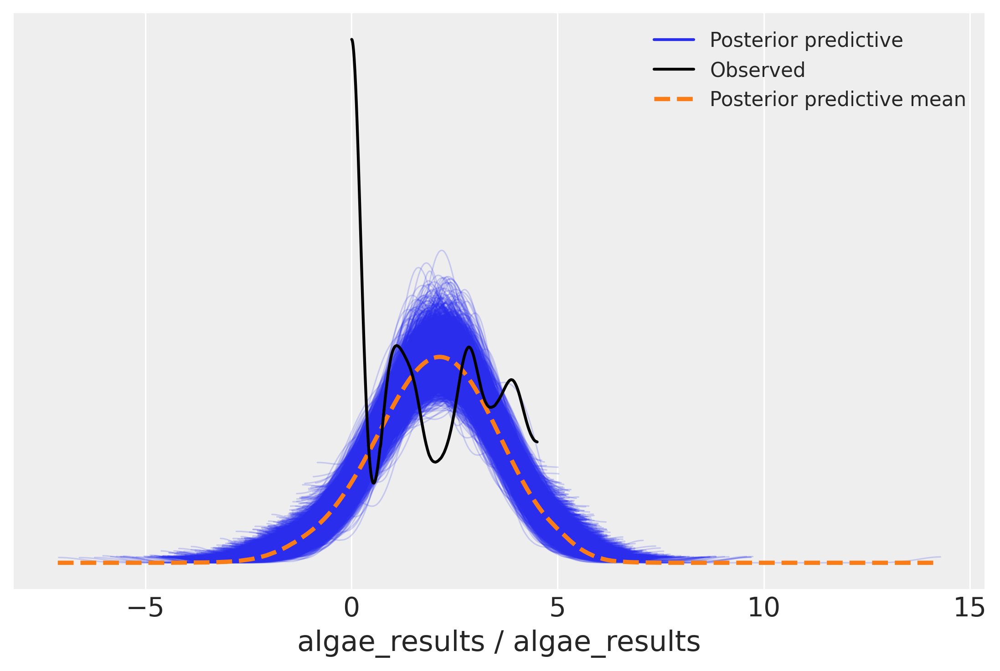

In [ ]:
az.plot_ppc(algae_pp)

In [31]:
#mutable data
with pm.Model() as robust_model_new:
    B0 = pm.Normal("B0", mu=0, sigma=10)
    B1 = pm.Normal("B1", mu=0, sigma=10)
    B2 = pm.Normal("B2", mu=0, sigma=10)
    B7 = pm.Normal("B7", mu=0, sigma=10)
    B8 = pm.Normal("B8", mu=0, sigma=10)

    a1 = pm.MutableData("a1", algae["a1"], dims="obs_id")
    mxPH = pm.MutableData("mxPH", zX[:, 0], dims="obs_id")
    mnO2 = pm.MutableData("mnO2", zX[:, 1], dims="obs_id")
    PO4 = pm.MutableData("PO4", zX[:, 6], dims="obs_id")
    Chla = pm.MutableData("Chla", zX[:, 7], dims="obs_id")


    mu = pm.Deterministic("mu", B0 + B1 * mxPH + B2 * mnO2 + B7 * PO4 + B8 * Chla)

    sigma = pm.Uniform('sigma', 10**-5, 10)
    nu = pm.Exponential('nu', 1/29.0)
    algae_results = pm.StudentT('algae_results', nu=nu, mu=mu, sigma=sigma, observed=a1)


In [32]:
with robust_model_new:
    algae_trace_pred = pm.sample(random_seed = random_seed)

In [34]:
#counterfactuals
new_Chla = np.linspace(-2,2, num=200)

new_mxPH = np.ma.zeros((200,))
new_mnO2 = np.ma.zeros((200,))
new_PO4 = np.ma.zeros((200,))




with robust_model_new:
    # update values of predictors:
    pm.set_data({"Chla": new_Chla,
                 "mxPH": new_mxPH,
                "mnO2": new_mnO2,
                "PO4": new_PO4})

    # use the updated values and predict outcomes and probabilities:
    algae_pp_pred = pm.sample_posterior_predictive(algae_trace_pred, var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    extend_inferencedata=True,
    random_seed=random_seed,
)

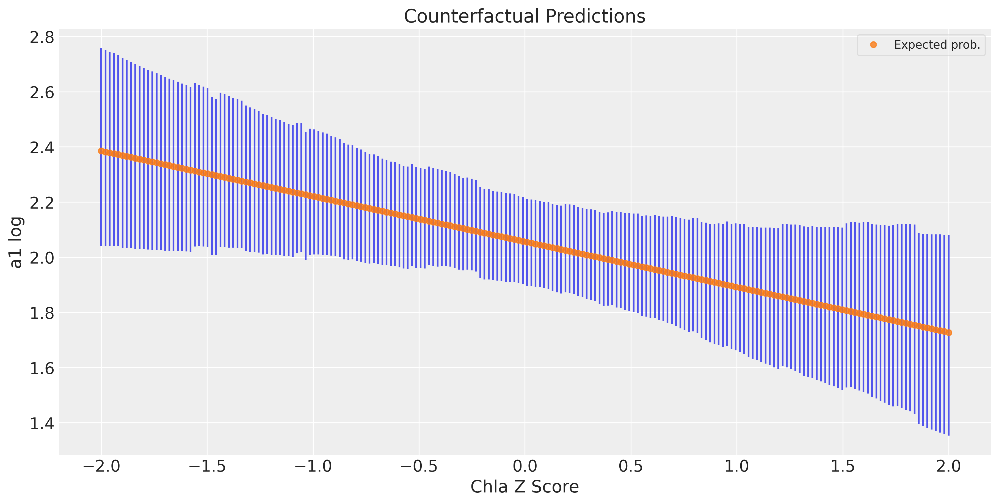

In [35]:
#Chla vs. a1, holding everything else constant
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = algae_pp_pred.predictions_constant_data["Chla"]
model_preds = algae_pp_pred.predictions

# uncertainty about the estimates:
ax.vlines(
    preds_counterfactual,
    *az.hdi(model_preds)["mu"].transpose("hdi", ...),
    alpha=0.8,
)

# expected probability of success:
ax.plot(
    preds_counterfactual,
    model_preds["mu"].mean(("chain", "draw")),
    "o",
    ms=5,
    color="C1",
    alpha=0.8,
    label="Expected prob.",
)

ax.set_xlabel("Chla Z Score")
ax.set_ylabel("a1 log")
ax.set_title("Counterfactual Predictions")
ax.legend(fontsize=10, frameon=True, framealpha=0.5)

As Chla increase, algal growth dereases. However, the SD increase at the tails due to fewer datapoints there.

### Non-Linear Model

I chose to remove all categorical variables and transform the mnO2 variable with the natural log based on the data shape in the original pairwise comparison graphs.

In [ ]:
#transform mnO2 variable with natural log
algae['mnO2_log'] = np.log(algae['mnO2'] + 1)

In [ ]:
#scale numeric predictor variables
X = algae[['mxPH', 'mnO2_log', 'Cl', 'NO3', 'NH4', 'oPO4', 'PO4', 'Chla']]
meanx = X.mean().values
scalex = X.std().values
zX = ((X-meanx)/scalex).values

In [ ]:
#mutable data non-linear model
with pm.Model() as robust_model_log:
    B0 = pm.Normal("B0", mu=0, sigma=10)
    B1 = pm.Normal("B1", mu=0, sigma=10)
    B2 = pm.Normal("B2", mu=0, sigma=10)
    B7 = pm.Normal("B7", mu=0, sigma=10)
    B8 = pm.Normal("B8", mu=0, sigma=10)

    a1 = pm.MutableData("a1", algae["a1"], dims="obs_id")
    mxPH = pm.MutableData("mxPH", zX[:, 0], dims="obs_id")
    mnO2_log = pm.MutableData("mnO2_log", zX[:, 1], dims="obs_id")
    PO4 = pm.MutableData("PO4", zX[:, 6], dims="obs_id")
    Chla = pm.MutableData("Chla", zX[:, 7], dims="obs_id")

    mu = pm.Deterministic("mu", B0 + B1*mxPH + B2*mnO2_log + B7*PO4 + B8*Chla)

    sigma = pm.Uniform('sigma', 10**-5, 10)
    nu = pm.Exponential('nu', 1/29.0)
    algae_results_log = pm.StudentT('algae_results_log', nu=nu, mu=mu, sigma=sigma, observed=a1)

In [ ]:
with robust_model_log:
    algae_trace_pred_log = pm.sample(random_seed = random_seed)

C:\Users\daven\anaconda3\lib\site-packages\pytensor\tensor\rewriting\elemwise.py:1028: UserWarning: Loop fusion failed because the resulting node would exceed the kernel argument limit.
  warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
C:\Users\daven\anaconda3\lib\site-packages\pytensor\tensor\rewriting\elemwise.py:1028: UserWarning: Loop fusion failed because the resulting node would exceed the kernel argument limit.
  warn(
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [B0, B1, B2, B7, B8, sigma, nu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 488 seconds.


In [ ]:
algae_pp1 = pm.sample_posterior_predictive(algae_trace_pred_log,
                                           model = robust_model_log, random_seed = random_seed)

Sampling: [algae_results_log]


<Axes: xlabel='algae_results_log / algae_results_log'>

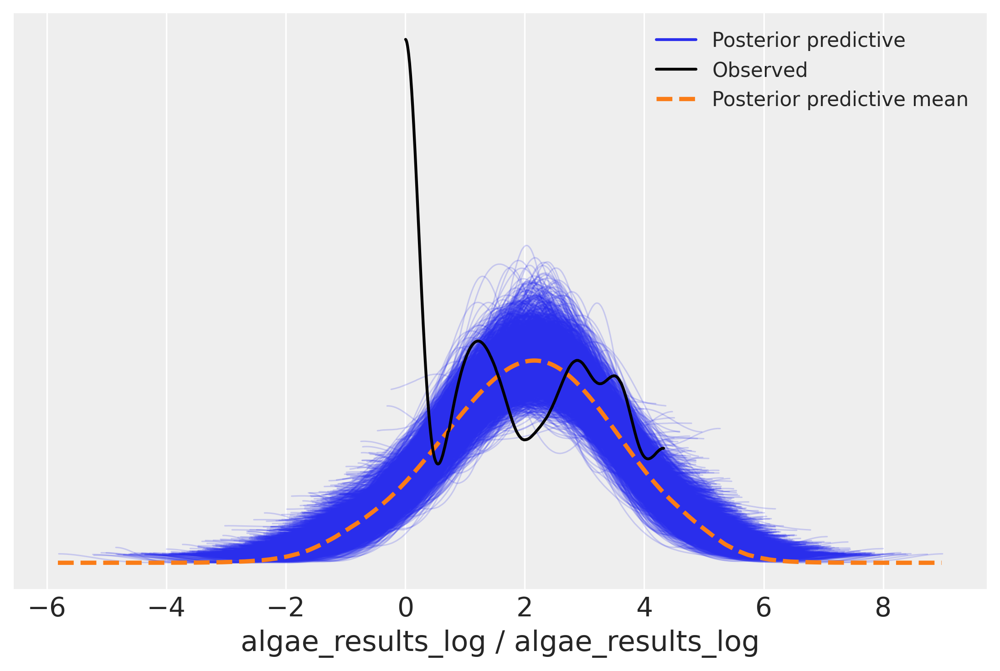

In [ ]:
az.plot_ppc(algae_pp1)

### Test Data (for non-linear model)

In [ ]:
algae_test = pd.read_csv("algaeTest.csv")

In [ ]:
#remove uneccesary columns
algae_test = algae_test[["7.95000", "5.70000", "380.00000", "XXXXXXX", "1.20000"]]

In [ ]:
#add column names
new_row_data = {
    7.95000: 'mxPH',
    5.70000: 'mnO2',
    380.00000: 'PO4',
    'XXXXXXX': 'Chla',
    1.20000: 'a1'
}

new_row_df = pd.DataFrame([new_row_data]).T
algae_test.columns = new_row_df[0]

In [ ]:
algae_test

,mxPH,mnO2,PO4,Chla,a1
0,7.98000,8.8,138.00000,7.10000,1.2
1,8.00000,7.2,113.71400,4.50000,7.0
2,8.35000,8.4,111.80000,3.20000,1.4
3,8.10000,13.2,40.00000,2.00000,3.9
4,8.37000,12.1,10.50700,13.80000,28.4
...,...,...,...,...,...
134,8.12000,10.2,49.65800,2.20000,18.1
135,8.43000,10.8,XXXXXXX,45.37500,1.1
136,8.70000,11.7,83.00000,17.00000,0.0
137,8.10000,8.2,88.12500,13.98000,0.0


In [ ]:
#Drop rows with at least one XXXXXX
algae_test = algae_test.replace("XXXXXXX", np.nan)
algae_test.dropna(inplace=True)

In [ ]:
algae_test = algae_test.astype(float)

In [ ]:
#transform response variable (a1) with natural log
algae_test['a1'] = np.log(algae_test['a1'] + 1)

In [ ]:
#transform mnO2 with log
algae_test['mnO2_log'] = np.log(algae_test['mnO2'] + 1)

In [ ]:
#scale numeric predictor variables
X = algae_test[['mxPH', 'mnO2_log', 'PO4', 'Chla']]
meanx = X.mean().values
scalex = X.std().values
zX = ((X-meanx)/scalex).values

#### Test Data on Non-Linear Model

In [ ]:
with robust_model_log:
    # Test data
    pm.set_data({"mxPH": zX[:,0],
                "mnO2_log": zX[:,1],
                "PO4": zX[:,2],
                "Chla": zX[:,3],
                "a1": algae_test["a1"]})

    #Predict outcomes
    algae_log_test = pm.sample_posterior_predictive(algae_trace_pred_log, var_names=["mu"],
        return_inferencedata=True,
        predictions=True,
        extend_inferencedata=True,
        random_seed=random_seed,
)

C:\Users\daven\anaconda3\lib\site-packages\pymc\model\core.py:2021: ShapeWarning: You are resizing a variable with dimension 'obs_id' which was initialized as a mutable dimension by another variable ('a1'). Remember to update that variable with the correct shape to avoid shape issues.
  model.set_data(variable_name, new_value, coords=coords)
Sampling: []


In [ ]:
#calculate MSE

mean_pred = algae_log_test.predictions["mu"].mean(dim=["chain", "draw"])
actual = algae_test["a1"] #actual y values

np.mean((mean_pred-actual)**2)

<xarray.DataArray ()>
array(1.37625197)

### Test Data (for linear model)

In [ ]:
algae_test1 = pd.read_csv("algaeTest.csv")

In [ ]:
#keep size, speed, mxPH, mnO2, PO4, Chla and a1
algae_test1 = algae_test1[["small_", "medium", "7.95000", "5.70000", "380.00000", "XXXXXXX", "1.20000"]]

In [ ]:
#add column names
new_row_data = {
    "small_": "size",
    "medium": "speed",
    7.95000: 'mxPH',
    5.70000: 'mnO2',
    380.00000: 'PO4',
    'XXXXXXX': 'Chla',
    1.20000: 'a1'
}

new_row_df = pd.DataFrame([new_row_data]).T
algae_test1.columns = new_row_df[0]

In [ ]:
#Drop rows with at least one XXXXXX
algae_test1 = algae_test1.replace("XXXXXXX", np.nan)
algae_test1.dropna(inplace=True)

In [ ]:
#re-code categorical data
replace_map = {"low___":0, "medium":1, "high__":2}
algae_test1["speed"] = algae_test1["speed"].map(replace_map)

replace_map = {"small_":0, "medium":1, "large_":2}
algae_test1["size"] = algae_test1["size"].map(replace_map)

In [ ]:
algae_test1 = algae_test1.astype(float)

In [ ]:
#transform response variable (a1) with natural log
algae_test1['a1'] = np.log(algae_test1['a1'] + 1)

In [ ]:
#scale numeric predictor variables
X1 = algae_test1[['mxPH', 'mnO2', 'PO4', 'Chla']]
meanx1 = X1.mean().values
scalex1 = X1.std().values
zX1 = ((X1-meanx1)/scalex1).values

#### Test Data on Linear Model

In [ ]:
with robust_model_new:
    # Test data
    pm.set_data({"mxPH": zX[:,0],
                "mnO2": zX[:,1],
                "PO4": zX[:,2],
                "Chla": zX[:,3],
                "a1": algae_test1["a1"],
                "size": algae_test1["size"].astype("int"),
                "speed": algae_test1["speed"].astype("int")})

    #Predict outcomes
    algae_test_pp = pm.sample_posterior_predictive(algae_trace_pred, var_names=["mu"],
        return_inferencedata=True,
        predictions=True,
        extend_inferencedata=True,
        random_seed=random_seed,
)

Sampling: []


In [ ]:
import numpy as np

In [ ]:
#calculate MSE

mean_pred = algae_test_pp.predictions["mu"].mean(dim=["chain", "draw"])
actual = algae_test1["a1"] #actual y values

np.mean((mean_pred-actual)**2)

<xarray.DataArray ()>
array(1.28076979)

We are not able to predict algal growth based on only chemical analysis. 

The MSE is smaller for the non-linear model.